In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import tensorflow as tf
import collections
import os
import random
import numpy as np
from tqdm import tqdm
from six.moves import urllib
from six.moves import xrange 
import sys, email
import pandas as pd 
import math


In [2]:
##Download Enron CSV from kaggle###

!pip install -U -q kaggle
!mkdir -p ~/.kaggle

In [3]:
#Upload your kaggle Json to pull kaggle API
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"xaarons","key":"1cebcd12abf74318a09f007c084bad0b"}'}

In [4]:
!cp kaggle.json ~/.kaggle/
!kaggle datasets download -d jhbros/enron-email-dataset
!ls

 96% 305M/319M [00:04<00:00, 57.5MB/s]
100% 319M/319M [00:04<00:00, 71.9MB/s]
enron-email-dataset.zip  kaggle.json  sample_data


In [5]:
import pandas as pd
#########################################################
# Load Enron dataset
#########################################################
emails_df = pd.read_csv('/content/enron-email-dataset.zip', compression='zip', header=0, sep=',', quotechar='"')
print(emails_df.shape)
emails_df.head()

(517401, 8)


,Message-ID,Date,From,To,Subject,Message,Cc,Bcc
0,<18782981.1075855378110.JavaMail.evans@thyme>,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",phillip.allen@enron.com,tim.belden@enron.com,NaN,Here is our forecast\n\n \n,NaN,NaN
1,<15464986.1075855378456.JavaMail.evans@thyme>,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",phillip.allen@enron.com,john.lavorato@enron.com,Re:,Traveling to have a business meeting takes the...,NaN,NaN
2,<24216240.1075855687451.JavaMail.evans@thyme>,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",phillip.allen@enron.com,leah.arsdall@enron.com,Re: test,test successful. way to go!!!\n,NaN,NaN
3,<13505866.1075863688222.JavaMail.evans@thyme>,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",phillip.allen@enron.com,randall.gay@enron.com,NaN,"Randy,\n\n Can you send me a schedule of the s...",NaN,NaN
4,<30922949.1075863688243.JavaMail.evans@thyme>,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",phillip.allen@enron.com,greg.piper@enron.com,Re: Hello,Let's shoot for Tuesday at 11:45. \n,NaN,NaN


In [6]:
# #########################################################
# # Load Enron dataset
# #########################################################

# ENRON_EMAIL_DATASET_PATH = '/content/drive/MyDrive/894/Group Project/enron.csv'

# # load enron dataset
# import pandas as pd 
# df = pd.read_csv(ENRON_EMAIL_DATASET_PATH)

In [7]:

print(emails_df.info())
emails_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517401 entries, 0 to 517400
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Message-ID  517401 non-null  object
 1   Date        517401 non-null  object
 2   From        517401 non-null  object
 3   To          495554 non-null  object
 4   Subject     498215 non-null  object
 5   Message     517401 non-null  object
 6   Cc          127881 non-null  object
 7   Bcc         127881 non-null  object
dtypes: object(8)
memory usage: 31.6+ MB
None


,Message-ID,Date,From,To,Subject,Message,Cc,Bcc
0,<18782981.1075855378110.JavaMail.evans@thyme>,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",phillip.allen@enron.com,tim.belden@enron.com,NaN,Here is our forecast\n\n \n,NaN,NaN
1,<15464986.1075855378456.JavaMail.evans@thyme>,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",phillip.allen@enron.com,john.lavorato@enron.com,Re:,Traveling to have a business meeting takes the...,NaN,NaN
2,<24216240.1075855687451.JavaMail.evans@thyme>,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",phillip.allen@enron.com,leah.arsdall@enron.com,Re: test,test successful. way to go!!!\n,NaN,NaN
3,<13505866.1075863688222.JavaMail.evans@thyme>,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",phillip.allen@enron.com,randall.gay@enron.com,NaN,"Randy,\n\n Can you send me a schedule of the s...",NaN,NaN
4,<30922949.1075863688243.JavaMail.evans@thyme>,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",phillip.allen@enron.com,greg.piper@enron.com,Re: Hello,Let's shoot for Tuesday at 11:45. \n,NaN,NaN


In [8]:
#########################################################
# Sort out required email features: date, subject, content
#########################################################

## Helper functions
message = emails_df


# keep only Subject and Content
emails_df = emails_df[['Date','Subject','Message']]


In [9]:
emails_df.head()

,Date,Subject,Message
0,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",NaN,Here is our forecast\n\n \n
1,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",Re:,Traveling to have a business meeting takes the...
2,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",Re: test,test successful. way to go!!!\n
3,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",NaN,"Randy,\n\n Can you send me a schedule of the s..."
4,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",Re: Hello,Let's shoot for Tuesday at 11:45. \n


In [10]:
#########################################################
# Deep Cleaning
#########################################################
from sklearn.impute import SimpleImputer 
import nltk.corpus
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [11]:
#########################################################
# Clean Subject and Content
#########################################################
 
# Copy our Enron data set
emails_sample_df = emails_df.copy()

import string, re
# clean up subject line
# Start by removing NaN
imputer_cat = SimpleImputer(missing_values = np.nan, strategy='constant')
imputer_cat.fit(emails_sample_df[['Subject']])
emails_sample_df['Subject'] = imputer_cat.transform(emails_sample_df[['Subject']])
# General Cleaning 
emails_sample_df['Subject'] = emails_sample_df['Subject'].str.lower()
emails_sample_df['Subject'] = emails_sample_df['Subject'].str.replace(r're:', ' ', regex=True)
emails_sample_df['Subject'] = emails_sample_df['Subject'].str.replace(r'missing_value', ' ', regex=True)   
emails_sample_df['Subject'] = emails_sample_df['Subject'].str.replace(r'fw:', ' ', regex=True) 
emails_sample_df['Subject'] = emails_sample_df['Subject'].str.replace(r'[^a-z]', ' ', regex=True)  
emails_sample_df['Subject'] = emails_sample_df['Subject'].str.replace(r'\s+', ' ', regex=True)  	
emails_sample_df['Subject'] = emails_sample_df['Subject'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
# clean up content line
emails_sample_df['Message'] = emails_sample_df['Message'].str.lower()
emails_sample_df['Message'] = emails_sample_df['Message'].str.replace(r'missing_value', ' ', regex=True)  
emails_sample_df['Message'] = emails_sample_df['Message'].str.replace(r'[^a-z]', ' ', regex=True)  
emails_sample_df['Message'] = emails_sample_df['Message'].str.replace(r'\s+', ' ', regex=True)  
emails_sample_df['Message'] = emails_sample_df['Message'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
# create sentence list 
emails_text = (emails_sample_df["Subject"] + emails_sample_df["Message"]).tolist()

#sentences = ' '.join(emails_text)
sentences = ' '.join([str(item) for item in emails_text])
words_0 = sentences.split()

In [12]:
words = words_0.copy()
print('Data size', len(words))

Data size 91281688


In [13]:
# get unique words and map to glove set
print('Unique word count', len(set(words))) 

Unique word count 718307


In [14]:
# drop rare words
vocabulary_size = 50000

In [15]:
def build_dataset(words):
  count = [['UNK', -1]]
  count.extend(collections.Counter(words).most_common(vocabulary_size - 1))
  dictionary = dict()
  for word, _ in count:
    dictionary[word] = len(dictionary)
  data = list()
  unk_count = 0
  for word in tqdm(words):
    if word in dictionary:
      index = dictionary[word]
    else:
      index = 0  # dictionary['UNK']
      unk_count += 1
    data.append(index)
  count[0][1] = unk_count
  reverse_dictionary = dict(zip(dictionary.values(), dictionary.keys()))
  return data, count, dictionary, reverse_dictionary

data, count, dictionary, reverse_dictionary = build_dataset(words)

del words  # Hint to reduce memory.
print('Most common words (+UNK)', count[:5])
print('Sample data', data[:10], [reverse_dictionary[i] for i in data[:10]])

100%|██████████| 91281688/91281688 [00:34<00:00, 2641856.39it/s]

Most common words (+UNK) [['UNK', 2927489], ('enron', 1879828), ('com', 1354135), ('ect', 1142408), ('hou', 579178)]
Sample data [1943, 3901, 42, 60, 1516, 1345, 1120, 1534, 1837, 712] ['forecast', 'traveling', 'business', 'meeting', 'takes', 'fun', 'trip', 'especially', 'prepare', 'presentation']


In [16]:
####################################################################
#Download Glove 
####################################################################
!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip -q glove.6B.zip

--2022-03-27 04:55:01--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2022-03-27 04:55:01--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2022-03-27 04:55:02--  http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glove.6

In [17]:
####################################################################
# find matches with glove 
####################################################################
#GLOVE_DATASET_PATH = '/content/drive/MyDrive/Pre-trained/glove.840B.300d.txt'
GLOVE_DATASET_PATH = 'glove.6B.300d.txt'

from tqdm import tqdm
import string
embeddings_index = {}
f = open(GLOVE_DATASET_PATH)
word_counter = 0
for line in tqdm(f):
  try:

      values = line.split()
      word = values[0]
      if word in dictionary:
          coefs = np.asarray(values[1:], dtype='float32',)
          embeddings_index[word] = coefs
      word_counter += 1
  
  except:
       values = line.split()
       word = ". . ."
       if word in dictionary:
          coefs = np.asarray(values[3:], dtype='float32',)
          embeddings_index[word] = coefs
       word_counter += 1


f.close()
print('Found %s word vectors matching enron data set.' % len(embeddings_index))
print('Total words in GloVe data set: %s' % word_counter)

400000it [00:08, 48960.66it/s]

Found 38626 word vectors matching enron data set.
Total words in GloVe data set: 400000


In [18]:
# create a dataframe using the embedded vectors and attach the key word as row header
import pandas as pd
enrond_dataframe = pd.DataFrame(embeddings_index)
enrond_dataframe = pd.DataFrame.transpose(enrond_dataframe)

In [19]:
# finding optimal number of clusters

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.pyplot as plt
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_score

100%|██████████| 3/3 [3:51:32<00:00, 4630.94s/it]


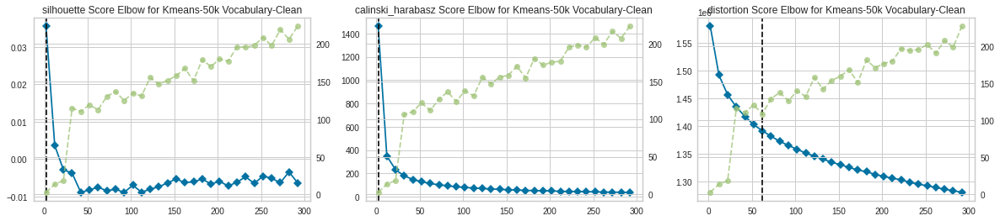

In [20]:
## finding optimal number of clusters
# Plot Elbow Score for Metrics - silhouette 
cluster=np.arange(start=2, stop=300, step=10)
cltuple=tuple(cluster)

fig, ax = plt.subplots(1, 3, figsize=(20,4) )
i=0 # initiate axis

for vismetrics in tqdm([ "silhouette", "calinski_harabasz", "distortion"]):
    # Defining the Algorithm
    model = KMeans(random_state=42)
    #Create Elbow instance for different metrics
    visualizer = KElbowVisualizer( model,  k=cltuple, metric=vismetrics, timings=True, locate_elbow=True, ax=ax[i])
    ax[i].set(title=str(vismetrics)+' Score Elbow for Kmeans-50k Vocabulary-Clean')
    #Fit the visualizer
    visualizer.fit(enrond_dataframe)
    i += 1

In [21]:

#########################################################
# Check out some clusters
#########################################################


 
# See what it learns and look at clusters to pull out major themes in the data
CLUSTER_SIZE = 50
# cluster vector and investigate top groups

kmeans = KMeans(n_clusters=CLUSTER_SIZE)
cluster_make = kmeans.fit_predict(enrond_dataframe)

labels = kmeans.predict(enrond_dataframe)
import collections
cluster_frequency = collections.Counter(labels)
print(cluster_frequency)
cluster_frequency.most_common()

clusters = {}
n = 0
for item in labels:
    if item in clusters:
        clusters[item].append(list(enrond_dataframe.index)[n])
    else:
        clusters[item] = [list(enrond_dataframe.index)[n]]
    n +=1

for k,v in cluster_frequency.most_common(100):
  print('\n\n')
  print('Cluster:', k)
  print (' '.join(clusters[k]))

Counter({11: 2434, 6: 1871, 0: 1644, 35: 1583, 34: 1489, 21: 1298, 45: 1122, 17: 1121, 3: 1077, 7: 1017, 46: 990, 12: 937, 38: 871, 20: 801, 2: 797, 14: 756, 25: 744, 5: 736, 31: 713, 18: 710, 22: 701, 23: 695, 28: 671, 16: 666, 1: 665, 42: 655, 39: 646, 49: 638, 15: 633, 44: 632, 19: 630, 41: 600, 10: 566, 33: 564, 9: 563, 30: 531, 36: 525, 48: 523, 29: 509, 13: 504, 37: 501, 43: 451, 40: 442, 26: 407, 47: 380, 8: 377, 4: 370, 27: 312, 32: 307, 24: 251})



Cluster: 11
bingaman maeda tani benedetto sabra bertone katayama shiokawa zsa aoyama mikulski dede hala lari kondo provenzano jeannine heintz izumi nassar miceli panos fortunato mixon gagliardi mize hayami arteaga masayuki dupre leiber katia henriques bijan perata zora nocera houten poirier yumi imai mcmullan wisner nobuo yamauchi eri makiko alexia costantino rika lauri mirna erma dejesus landman spyros dena prevost kath bernardi miron dele debi lani lindo michaud erlanger dianna bushman jacki ging demetrios krumm charon mattson sa

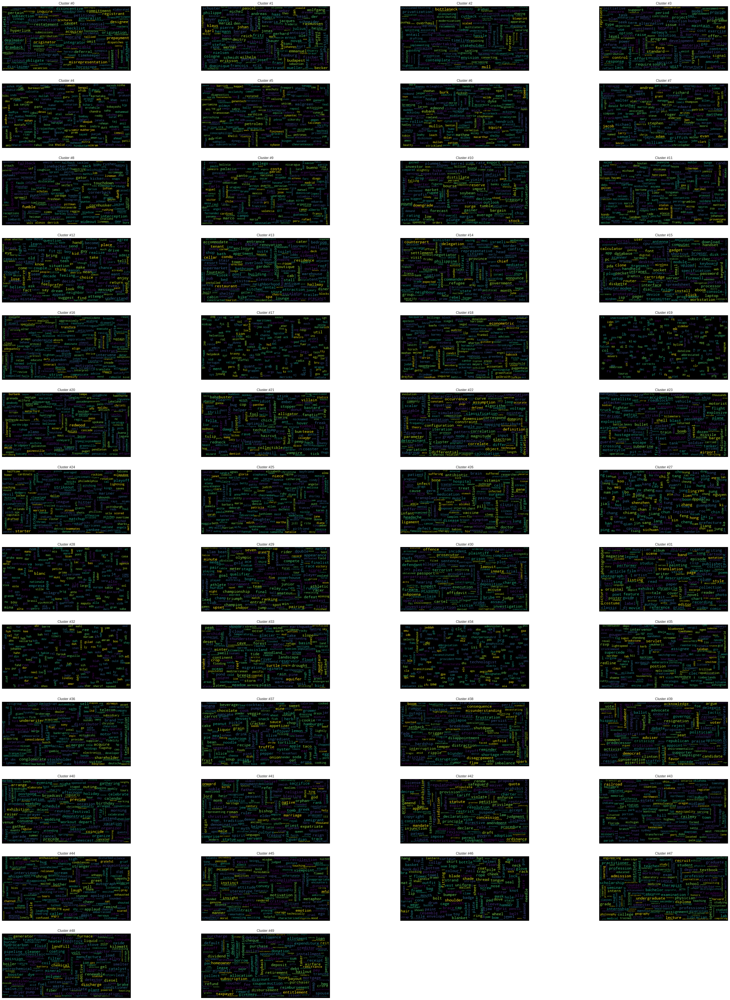

In [22]:
# Generate a word cloud image
from wordcloud import WordCloud


def display_wordcloud(top_words, n_components):
    plt.figure(figsize=(48, 64))
    j = np.ceil(n_components/4)
    for t in range(n_components):
        i=t+1
        plt.subplot(j, 4, i ).set_title("Cluster #" + str(t))
        plt.plot()
        mywords = ' '.join(top_words[t])
        plt.axis("off")
        wordcloud = WordCloud(max_font_size=12).generate(mywords)
        plt.imshow(wordcloud, interpolation="bilinear")
    plt.show();

n_components = 50
display_wordcloud(clusters, n_components)

In [23]:
#########################################################
# Check out some clusters
#########################################################


 
# See what it learns and look at clusters to pull out major themes in the data
CLUSTER_SIZE = 64 
# cluster vector and investigate top groups

kmeans = KMeans(n_clusters=CLUSTER_SIZE)
cluster_make = kmeans.fit_predict(enrond_dataframe)

labels = kmeans.predict(enrond_dataframe)
import collections
cluster_frequency = collections.Counter(labels)
print(cluster_frequency)
cluster_frequency.most_common()

clusters = {}
n = 0
for item in labels:
    if item in clusters:
        clusters[item].append(list(enrond_dataframe.index)[n])
    else:
        clusters[item] = [list(enrond_dataframe.index)[n]]
    n +=1

for k,v in cluster_frequency.most_common(100):
  print('\n\n')
  print('Cluster:', k)
  print (' '.join(clusters[k]))

Counter({33: 2386, 16: 1892, 3: 1690, 56: 1318, 55: 1249, 37: 1227, 14: 1115, 41: 1037, 24: 1035, 54: 737, 22: 716, 7: 710, 60: 697, 15: 688, 53: 637, 48: 632, 47: 627, 61: 619, 46: 616, 20: 613, 57: 612, 19: 584, 17: 571, 13: 559, 36: 553, 39: 551, 63: 546, 21: 532, 1: 528, 50: 527, 23: 509, 2: 500, 27: 490, 35: 471, 44: 456, 43: 452, 5: 447, 9: 445, 4: 443, 31: 443, 6: 437, 28: 434, 45: 433, 12: 430, 18: 411, 49: 400, 58: 399, 32: 377, 11: 371, 62: 362, 0: 356, 40: 336, 8: 328, 26: 320, 10: 320, 59: 317, 34: 308, 29: 288, 25: 284, 38: 276, 51: 273, 42: 266, 30: 236, 52: 204})



Cluster: 33
bingaman maeda tani soma adonis benedetto sabra bertone katayama shiokawa aoyama peri lora hala lari kondo elio provenzano jeannine dian schnur heintz izumi nassar miceli panos lavine fortunato mixon gagliardi hayami masayuki dupre katia zev henriques bijan mgr perata castiglione nocera houten yumi imai mcmullan nobuo eri makiko alexia costantino rika lauri bronstein mirna erma boatman landman spy

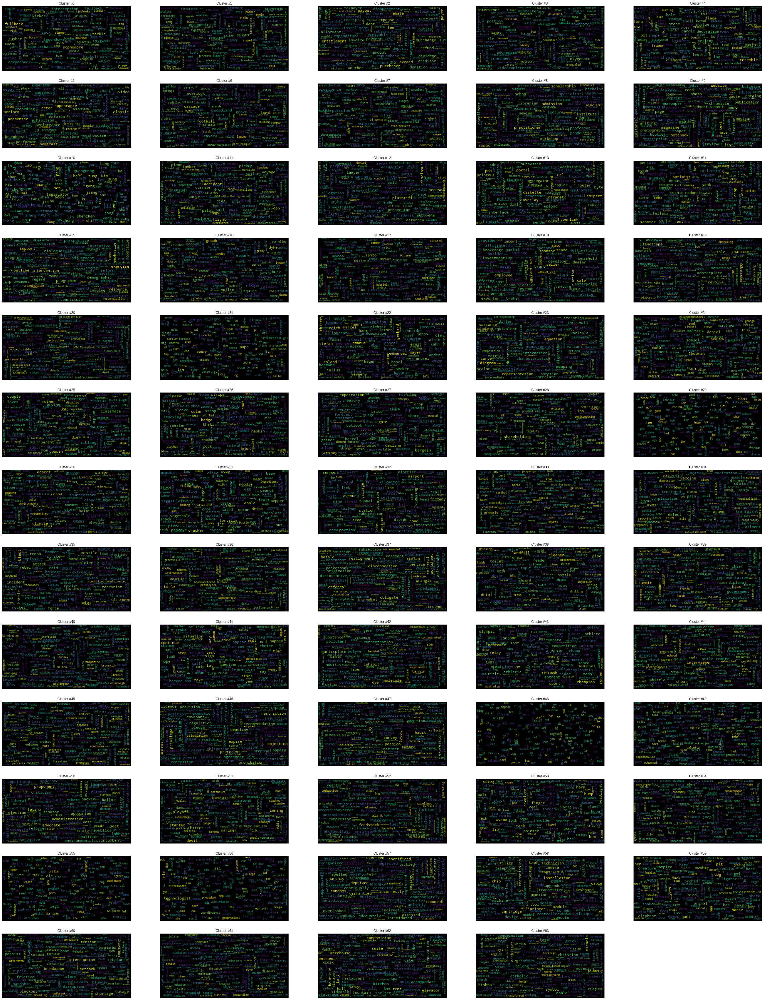

In [24]:
# Generate a word cloud image
from wordcloud import WordCloud


def display_wordcloud(top_words, n_components):
    plt.figure(figsize=(48, 64))
    j = np.ceil(n_components/5)
    for t in range(n_components):
        i=t+1
        plt.subplot(j, 5, i ).set_title("Cluster #" + str(t))
        plt.plot()
        mywords = ' '.join(top_words[t])
        plt.axis("off")
        wordcloud = WordCloud(max_font_size=12).generate(mywords)
        plt.imshow(wordcloud, interpolation="bilinear")
    plt.show();

n_components = 64
display_wordcloud(clusters, n_components)

In [25]:
####################################################
# Load master clusters for all six deparatments
####################################################
LEGAL =['abolished',	'abortion',	'accordance',	'accordingly',	'act',	'administrative',	'admission',	'adoption',	'affirmative',	'affirmed',	'alleged',	'alleging',	'amended',	'amendment',	'amendments',	'antitrust',	'appeal',	'appealed',	'appeals',	'appellate',	'applies',	'apply',	'applying',	'arbitration',	'arguments',	'attorney',	'attorneys',	'audit',	'authorized',	'bail',	'ban',	'bankruptcy',	'banning',	'bans',	'barred',	'binding',	'breach',	'bribery',	'case',	'cases',	'charged',	'charges',	'charging',	'citizenship',	'civil',	'claim',	'claims',	'clause',	'commissioners',	'complaint',	'complaints',	'compliance',	'comply',	'concerning',	'conduct',	'consent',	'consideration',	'constitute',	'constitutional',	'constitutionality',	'constitutionally',	'contends',	'conventions',	'conviction',	'convictions',	'copyright',	'counsel',	'counts',	'court',	'courts',	'criminal',	'damages',	'dealings',	'decision',	'decree',	'decrees',	'defendant',	'defendants',	'denial',	'denied',	'deny',	'denying',	'designation',	'disciplinary',	'disclose',	'disclosure',	'discrimination',	'dismiss',	'dismissal',	'dispute',	'dissented',	'dissenting',	'divorce',	'enacted',	'enforce',	'enforced',	'enforcement',	'epa',	'ethics',	'exceptions',	'excluded',	'expired',	'expires',	'explicitly',	'federal',	'file',	'filed',	'filing',	'fined',	'fines',	'firearms',	'fraud',	'freedoms',	'granted',	'granting',	'grounds',	'guidelines',	'harassment',	'hearing',	'hearings',	'immigration',	'immunity',	'impeachment',	'impose',	'imposed',	'imposing',	'indefinitely',	'indictment',	'ins',	'insider',	'inspections',	'instances',	'intent',	'interference',	'interpretation',	'invalidate',	'invalidated',	'irregularities',	'issuing',	'judge',	'judgement',	'judges',	'judgment',	'judgments',	'judicial',	'judiciary',	'jurisdiction',	'jurisprudence',	'jurors',	'jury',	'justice',	'justices',	'justified',	'justify',	'juvenile',	'law',	'laws',	'lawsuit',	'lawsuits',	'lawyer',	'lawyers',	'legal',	'legality',	'legally',	'legislation',	'liability',	'liberties',	'license',	'licenses',	'licensing',	'limitations',	'limiting',	'litigation',	'mandatory',	'marriages',	'minors',	'misconduct',	'moratorium',	'notified',	'obligation',	'obligations',	'obtaining',	'offenders',	'offenses',	'outright',	'overrule',	'overruled',	'overturn',	'overturned',	'overturning',	'pardon',	'parole',	'passport',	'patent',	'patents',	'penalties',	'penalty',	'pending',	'permission',	'permit',	'permits',	'permitted',	'petition',	'plaintiff',	'plaintiffs',	'plea',	'precedent',	'precedents',	'privacy',	'privilege',	'probable',	'probation',	'procedure',	'procedures',	'proceed',	'proceedings',	'prohibited',	'proposition',	'prosecuted',	'prosecution',	'prosecutorial',	'provision',	'provisions',	'punishment',	'quotas',	'ratified',	'recommend',	'recount',	'refuse',	'regarding',	'registration',	'regulate',	'regulation',	'regulations',	'regulators',	'relating',	'removal',	'requests',	'requirement',	'requiring',	'resolutions',	'restrict',	'restrictions',	'reversed',	'reviewing',	'revision',	'rights',	'ruled',	'rules',	'ruling',	'rulings',	'scrutiny',	'sec',	'secrecy',	'sentence',	'sentences',	'sentencing',	'settlement',	'settlements',	'sexual',	'shall',	'signatures',	'specify',	'statute',	'strict',	'submit',	'sue',	'sued',	'supreme',	'suspend',	'suspension',	'testify',	'testimony',	'trials',	'tribunal',	'tribunals',	'unanimous',	'unconstitutional',	'unfair',	'unrelated',	'upheld',	'uphold',	'upholding',	'upholds',	'valid',	'verdict',	'verify',	'violate',	'violated',	'violating',	'violation',	'violations',	'visa',	'visas',	'voluntarily',	'warrant',	'warrants',	'wrongdoing']
COMMUICATIONS	= ['accelerate',	'accomplish',	'accountability',	'achieve',	'achievements',	'achieving',	'actively',	'adjust',	'adopt',	'adopting',	'advancing',	'advocacy',	'agreements',	'aim',	'aimed',	'aiming',	'aims',	'alternatives',	'ambitious',	'apec',	'arrangements',	'asean',	'aspects',	'assess',	'assessment',	'assist',	'assistance',	'assure',	'awareness',	'balanced',	'barriers',	'beneficial',	'bilateral',	'bolster',	'boosting',	'breakthrough',	'broader',	'capability',	'careers',	'challenges',	'civic',	'clerical',	'collective',	'commitment',	'commitments',	'comprehensive',	'concentrate',	'conservation',	'consolidation',	'constructive',	'consultation',	'contracting',	'contribute',	'contribution',	'cooperation',	'cooperative',	'coordinate',	'coordinated',	'coordination',	'councils',	'creation',	'credible',	'criteria',	'crucial',	'department',	'diplomacy',	'doha',	'economic',	'economies',	'effectiveness',	'efficiency',	'effort',	'efforts',	'eliminating',	'emphasis',	'employed',	'employee',	'employees',	'employer',	'employers',	'employment',	'enable',	'enabling',	'encourage',	'encouraging',	'engage',	'engagement',	'enhance',	'enhanced',	'enhancing',	'enrichment',	'ensure',	'ensuring',	'entrepreneurs',	'equality',	'essential',	'establish',	'establishing',	'evaluate',	'evaluation',	'examine',	'examining',	'exchanges',	'expanding',	'experienced',	'explore',	'exploring',	'facilitate',	'finances',	'fisheries',	'flexibility',	'flexible',	'focusing',	'forge',	'foundations',	'framework',	'freelance',	'fulfill',	'fulltime',	'functioning',	'fundamental',	'generalist',	'globalization',	'governance',	'governmental',	'guarantee',	'healthcare',	'helping',	'hire',	'hired',	'hires',	'hiring',	'hourly',	'humanitarian',	'implement',	'implementation',	'implemented',	'implementing',	'importance',	'improve',	'improving',	'infrastructure',	'initiated',	'initiative',	'initiatives',	'innovation',	'innovative',	'institutional',	'integration',	'intensive',	'intern',	'interviewing',	'introduce',	'introducing',	'job',	'jobs',	'jointly',	'labor',	'labour',	'lasting',	'launching',	'maintaining',	'managerial',	'manpower',	'meaningful',	'measures',	'mechanism',	'mechanisms',	'migration',	'ministries',	'monetary',	'multi',	'multinational',	'negotiation',	'objective',	'objectives',	'office',	'organisation',	'organisations',	'organizing',	'outlined',	'overhaul',	'oversee',	'overseeing',	'oversees',	'oversight',	'paralegal',	'participation',	'partnership',	'partnerships',	'personnel',	'placements',	'policies',	'positions',	'possibilities',	'poverty',	'prepare',	'preservation',	'preserve',	'preventing',	'principles',	'priorities',	'priority',	'privatization',	'productive',	'profession',	'professional',	'professions',	'programme',	'programmes',	'progress',	'proliferation',	'promote',	'promoting',	'promotion',	'prompt',	'prosperity',	'protecting',	'pursue',	'pursuing',	'qualified',	'rebuild',	'rebuilding',	'receptionist',	'recommendations',	'reconstruction',	'recruit',	'recruiter',	'recruiters',	'recruiting',	'recruitment',	'reforms',	'regulatory',	'rehabilitation',	'renewal',	'resolving',	'responsibilities',	'restoration',	'restore',	'restoring',	'restructuring',	'resume',	'resumes',	'revive',	'safeguard',	'salaried',	'salaries',	'salary',	'scope',	'securing',	'seeking',	'skilled',	'solution',	'solutions',	'solve',	'solving',	'spur',	'stability',	'stabilize',	'staff',	'staffing',	'steps',	'stimulus',	'straits',	'strategic',	'strategies',	'strategy',	'strengthen',	'strengthened',	'strengthening',	'structural',	'supervision',	'supervisor',	'sustain',	'sustainable',	'sweeping',	'systematic',	'task',	'tasks',	'technological',	'thorough',	'tighten',	'towards',	'trainee',	'transform',	'transformation',	'transition',	'transitional',	'transparency',	'transparent',	'umbrella',	'undermine',	'understanding',	'undertaken',	'unified',	'upgrade',	'vacancies',	'vacancy',	'viable',	'vision',	'vital',	'voluntary',	'welfare',	'worker',	'workers',	'workforce',	'workplace']
SECURITY_SPAM_ALERTS =[	'acquistion',	'alchemy',	'anyways',	'ashington',	'asshole',	'bachelorette',	'beltway',	'bitch',	'bitches',	'blackjack',	'bondage',	'bothers',	'bragging',	'conciliator',	'consignment',	'countersigned',	'daddy',	'dealmaker',	'dhl',	'drool',	'dunkirk',	'elves',	'escapee',	'exotica',	'fanatic',	'fireman',	'fuck',	'fuckin',	'funnies',	'governmentally',	'graces',	'grunting',	'gump',	'helpdesk',	'hooters',	'hotwire',	'https',	'hyperlink',	'inbound',	'initialed',	'intrusion',	'intrusive',	'invaded',	'isolates',	'karma',	'kidnapped',	'kinks',	'kleenex',	'limiting',	'lockbox',	'login',	'logins',	'logon',	'lookin',	'lured',	'malaria',	'malicious',	'manicure',	'masked',	'meds',	'meritocracy',	'minimise',	'minimize',	'minimizing',	'misuse',	'mite',	'mitigating',	'monetization',	'mosquito',	'motorcade',	'naughty',	'nuisance',	'offending',	'orginal',	'outbreak',	'outrigger',	'overrun',	'passcode',	'password',	'passwords',	'payee',	'peeing',	'pics',	'pissed',	'plaintext',	'pneumonia',	'policeman',	'potentially',	'powerball',	'preliminarily',	'prog',	'puss',	'pussy',	'reboots',	'reinserted',	'reinstalled',	'remapping',	'rerun',	'resend',	'restful',	'resupply',	'rooming',	'sailboat',	'scam',	'sequent',	'shutterfly',	'signoff',	'slut',	'smack',	'spam',	'squawk',	'stakeout',	'stinky',	'sweetie',	'tits',	'tonnage',	'uglier',	'unplug',	'unsubscribed',	'waitin',	'whew',	'xxxxxxx']																																																																																																																																																																																									
SUPPORT	= ['accessed',	'accessibility',	'accessing',	'adapter',	'adobe',	'alerts',	'api',	'app',	'apps',	'atm',	'audio',	'authentication',	'automation',	'bandwidth',	'blackberry',	'blu',	'bluetooth',	'broadband',	'browse',	'browser',	'browsers',	'browsing',	'bundle',	'bundled',	'bytes',	'cache',	'cad',	'calculator',	'cassette',	'cellphone',	'cgi',	'chat',	'checkout',	'click',	'clicking',	'clicks',	'clones',	'com',	'commands',	'compatibility',	'compatible',	'compliant',	'computerized',	'computers',	'computing',	'configured',	'connect',	'connectivity',	'console',	'consoles',	'copying',	'cpu',	'customized',	'cyberspace',	'database',	'databases',	'delete',	'desktop',	'dial',	'dialing',	'digital',	'digitally',	'directories',	'directory',	'disable',	'disk',	'disks',	'download',	'downloadable',	'downloaded',	'downloading',	'downloads',	'dram',	'ds',	'dsl',	'dvds',	'email',	'embedded',	'enables',	'encrypted',	'encryption',	'enhancements',	'ethernet',	'excel',	'extensions',	'faxes',	'fi',	'files',	'filtering',	'finder',	'firewall',	'floppy',	'folder',	'font',	'fonts',	'formats',	 'frozen',	'functionality',	'gadgets',	'gis',	'google',	'gps',	'graphical',	'graphics',	'gsm',	'gui',	'hacker',	'hackers',	'hacking',	'handheld',	'handset',	'handsets',	'hardware',	'hd',	'html',	'http',	'ic',	'id',	'ie',	'ieee',	'implementations',	'indexing',	'interactive',	'interface',	'interfaces',	'interrupt',	'ios',	'ip',	'iso',	'isp',	'isps',	'java',	'kernel',	'keyboard',	'keyword',	'laptop',	'laptops',	'layouts',	'linux',	'mac',	'macintosh',	'macs',	'mainframe',	'mb',	'messaging',	'messenger',	'microprocessor',	'microsoft',	'mode',	'modem',	'modems',	'modular',	'module',	'modules',	 'monitor',	'msn',	'multimedia',	'nes',	'netscape',	'networked',	'networking',	'nexus',	'nintendo',	'offline',	'os',	'packet',	'packets',	'pager',	'password',	'passwords',	'pc',	'pcs',	'pdf',	'pentium',	'phones',	'platforms',	'playback',	'playstation',	'portal',	'portals',	'printer',	'printers',	'processor',	'processors',	'programmed',	'programmer',	'programmers',	'proprietary',	'protocol',	'protocols',	'queue',	'quicken',	'registers',	'repository',	'retrieval',	'rom',	'routing',	'scan',	'scanner',	'scanners',	'scanning',	'seamlessly',	'sender',	'server',	'servers',	'settings',	'signage',	'simulator',	'slots',	'sms',	'software',	'specification',	'specifications',	'standalone',	'startup',	'streaming',	'subscriber',	'subscribers',	'supercomputer',	'sync',	'tab',	'telephony',	'ticketing',	'tivo',	'tokens',	'transmit',	'typing',	'ubiquitous',	'unix',	'upgrades',	'upload',	'uploaded',	'usb',	'user',	'users',	'utilizes',	'vcr',	'vendor',	'vhs',	'virtual',	'vista',	'warp',	'wi',	'wii',	'windows',	'wireless',	'xbox',	'xml',	'xp',	'zip']																																																									
ENERGY_DESK	= ['absorb',	'absorbed',	'absorbing',	'absorption',	'accumulate',	'accumulation',	'acid',	'additive',	'additives',	'aluminium',	'ammonia',	'arsenic',	'asbestos',	'atmospheric',	'atom',	'atoms',	'barrels',	'bio',	'biomass',	'bonded',	'bpd',	'byproduct',	'calcium',	'capsules',	'carbon',	'catalytic',	'charcoal',	'chemical',	'chemicals',	'cleaner',	'coal',	'coating',	'cobalt',	'combustion',	'compounds',	'concentration',	'concentrations',	'consume',	'consumed',	'consuming',	'contaminants',	'contaminated',	'contamination',	'converting',	'converts',	'copper',	'corrosion',	'cubic',	'decay',	'degradation',	'depleted',	'depletion',	'dilute',	'diluted',	'dioxide',	'discharge',	'discharges',	'disposal',	'dissolved',	'dredging',	'drying',	'dumping',	'dumps',	'emission',	'emissions',	'emit',	'emitted',	'emitting',	'enriched',	'environmentally',	'ethanol',	'excess',	'exported',	'exporting',	'extract',	'extracted',	'extracting',	'extraction',	'fatty',	'fertilizer',	'fertilizers',	'fiber',	'fibers',	'filtered',	'flammable',	'fluids',	'footprint',	'fossil',	'fuel',	'fuels',	'fumes',	'furnace',	'furnaces',	'gallons',	'gas',	'gases',	'gel',	'geothermal',	'glucose',	'gram',	'grams',	'greenhouse',	'groundwater',	'harmful',	'hazardous',	'heat',	'heating',	'helium',	'hydrocarbons',	'hydroelectric',	'hydrogen',	'hydropower',	'imported',	'importing',	'ingredient',	'intake',	'ion',	'ions',	'kerosene',	'kilowatt',	'landfill',	'leak',	'leakage',	'leaking',	'leaks',	'liquefied',	'liquid',	'liquids',	'liter',	'lng',	'magma',	'magnesium',	'manufacture',	'manure',	'megawatt',	'megawatts',	'mercury',	'metals',	'meth',	'methane',	'metric',	'mineral',	'minerals',	'moisture',	'molecules',	'monoxide',	'mw',	'newsprint',	'nickel',	'nitrogen',	'odor',	'oils',	'ore',	'organic',	'oxide',	'oxygen',	'ozone',	'packaging',	'paints',	'palladium',	'particles',	'particulate',	'pellets',	'pesticides',	'petrol',	'petroleum',	'pipelines',	'plant',	'plants',	'plasma',	'plastics',	'plutonium',	'poisonous',	'pollutants',	'polluted',	'polluters',	'polluting',	'pollution',	'polymer',	'polymers',	'precursor',	'processed',	'produces',	'propane',	'pumping',	'quantities',	'radioactive',	'raw',	'reactive',	'reactor',	'reactors',	'reclamation',	'recycle',	'recycled',	'recycling',	'refined',	'refineries',	'refiners',	'refinery',	'refining',	'renewable',	'reprocessing',	'residual',	'residue',	'resin',	'saturated',	'semen',	'semiconductors',	'sewage',	'silicon',	'smog',	'sodium',	'solvent',	'soot',	'sourced',	'spewing',	'spills',	'spores',	'stockpile',	'storage',	'storing',	'substances',	'substitutes',	'sulfur',	'sulphur',	'sunlight',	'synthetic',	'tar',	'textiles',	'thermal',	'titanium',	'tnt',	'tonne',	'tonnes',	'tons',	'toothpaste',	'toxic',	'trapping',	'unleaded',	'untapped',	'uranium',	'usable',	'utilization',	'uv',	'vapor',	'wafer',	'waste',	'wastes',	'wastewater',	'zinc']																																																								
SALES_DEPARTMENT	= ['accumulated',	'acquisitions',	'affiliates',	'aig',	'allocated',	'allocation',	'amounted',	'assessed',	'asset',	'assets',	'auction',	'auctions',	'bailout',	'bankers',	'bankrupt',	'banks',	'beneficiaries',	'bets',	'betting',	'billing',	'billions',	'bills',	'bonus',	'bonuses',	'borrow',	'borrowed',	'borrowers',	'borrowing',	'bribes',	'brokers',	'budgets',	'buyer',	'buyers',	'buyout',	'cash',	'certificates',	'charitable',	'charities',	'checks',	'chunk',	'collect',	'collectors',	'commissions',	'compensate',	'compensation',	'contracts',	'costing',	'credit',	'creditors',	'credits',	'debt',	'debts',	'default',	'deposit',	'deposited',	'deposits',	'derivatives',	'discount',	'discounts',	'distributors',	'dividend',	'dividends',	'dlrs',	'dollars',	'donate',	'donated',	'donation',	'donations',	'doubling',	'eligible',	'employer',	'equity',	'euros',	'exceed',	'exempt',	'expenditure',	'expenditures',	'expense',	'expenses',	'fannie',	'fares',	'federally',	'fee',	'fees',	'financed',	'financing',	'fraction',	'francs',	'fund',	'funds',	'generous',	'gifts',	'grants',	'guaranteed',	'guarantees',	'hedge',	'hefty',	'holders',	'homeowners',	'households',	'incentive',	'incentives',	'income',	'incomes',	'inheritance',	'installment',	'insurance',	'insurers',	'invest',	'invested',	'investing',	'investments',	'ipo',	'irs',	'junk',	'lease',	'lend',	'lender',	'lenders',	'lending',	'loan',	'loans',	'lottery',	'medicaid',	'medicare',	'merchandise',	'merchants',	'mergers',	'money',	'monthly',	'mortgage',	'mortgages',	'ordering',	'origination',	'outlets',	'overage',	'overdraft',	'overstock',	'owe',	'owed',	'owes',	'owner',	'owners',	'owning',	'packages',	'paid',	'pay',	'payable',	'payables',	'paying',	'payment',	'payments',	'payroll',	'pays',	'pension',	'pensions',	'portfolios',	'postage',	'postmarked',	'pounds',	'premium',	'premiums',	'prepaid',	'prepay',	'prepayment',	'price',	'priced',	'prices',	'pricey',	'pricing',	'proceeds',	'product',	'products',	'proforma',	'purchase',	'purchased',	'purchaser',	'purchases',	'purchasing',	'quota',	'rebate',	'rebook',	'rebooked',	'rebooking',	'receipts',	'receivable',	'receivables',	'recipients',	'reconciliations',	'recordkeeping',	'redeem',	'redeemable',	'reductions',	'refund',	'refundable',	'refunded',	'refunding',	'refunds',	'remittance',	'rent',	'repay',	'resell',	'reselling',	'retail',	'retailer',	'retailing',	'retirees',	'retirement',	'revenue',	'revenues',	'reward',	'rewards',	'richest',	'royalty',	'rupees',	'salaries',	'salary',	'sale',	'savings',	'securities',	'sell',	'seller',	'sellers',	'selling',	'sells',	'shareholders',	'shipment',	'shipments',	'shipped',	'shipper',	'shippers',	'shipping',	'shop',	'shopped',	'shopping',	'shops',	'sizable',	'slash',	'slashing',	'sold',	'sponsorship',	'spreadsheets',	'stamps',	'store',	'stores',	'strapped',	'subscription',	'subsidy',	'sum',	'sums',	'supermarket',	'supermarkets',	'superstore',	'supplier',	'supplies',	'supply',	'surcharge',	'surcharges',	'swap',	'tariff',	'tariffs',	'tax',	'taxation',	'taxes',	'taxpayer',	'taxpayers',	'ticket',	'tickets',	'timesheet',	'timesheets',	'totaled',	'totaling',	'totals',	'trades',	'transaction',	'transfers',	'treasury',	'trillion',	'tuition',	'undisclosed',	'unemployed',	'unlimited',	'unpaid',	'upfront',	'valued',	'vanguard',	'vending',	'vendor',	'verifications',	'voucher',	'vouchers',	'wage',	'wages',	'warehouse',	'warehouses',	'wholesale',	'wholesaler',	'wholesaling',	'worth']						


In [26]:
# boost bags with cosine distance from full glove data set
from tqdm import tqdm
import string
embeddings_index = {}
f = open(GLOVE_DATASET_PATH, encoding="utf8")
word_counter = 0
for line in tqdm(f):
    values = line.split()
    word = values[0]
    # difference here as we don't intersect words, we take most of them
    if (word.islower() and word.isalpha()): # work with smaller list of vectors
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs
    word_counter += 1
f.close()

400000it [00:19, 21002.18it/s]


In [27]:
# create a dataframe using the embedded vectors and attach the key word as row header
glove_dataframe = pd.DataFrame(embeddings_index)
glove_dataframe = pd.DataFrame.transpose(glove_dataframe)

In [28]:
departments = [LEGAL, COMMUICATIONS, SECURITY_SPAM_ALERTS, SUPPORT, ENERGY_DESK, SALES_DEPARTMENT]

In [29]:
temp_matrix = pd.DataFrame(glove_dataframe)
import scipy
import scipy.spatial

In [30]:
vocab_boost_count = 5
for group_id in range(len(departments)):
    print('Working bag number:', str(group_id))
    glove_dataframe_temp = glove_dataframe.copy()
    vocab = []
    for word in departments[group_id]:
        print(word)
        vocab.append(word)
        cos_dist_rez = scipy.spatial.distance.cdist(temp_matrix, np.array(glove_dataframe.loc[word])[np.newaxis,:], metric='cosine')
        # find closest words to help
        glove_dataframe_temp['cdist'] = cos_dist_rez
        glove_dataframe_temp = glove_dataframe_temp.sort_values(['cdist'], ascending=[1])
        vocab = vocab + list(glove_dataframe_temp.head(vocab_boost_count).index)
    # replace boosted set to old department group and remove duplicates
    departments[group_id] = list(set(vocab))

Working bag number: 0
abolished
abortion
accordance
accordingly
act
administrative
admission
adoption
affirmative
affirmed
alleged
alleging
amended
amendment
amendments
antitrust
appeal
appealed
appeals
appellate
applies
apply
applying
arbitration
arguments
attorney
attorneys
audit
authorized
bail
ban
bankruptcy
banning
bans
barred
binding
breach
bribery
case
cases
charged
charges
charging
citizenship
civil
claim
claims
clause
commissioners
complaint
complaints
compliance
comply
concerning
conduct
consent
consideration
constitute
constitutional
constitutionality
constitutionally
contends
conventions
conviction
convictions
copyright
counsel
counts
court
courts
criminal
damages
dealings
decision
decree
decrees
defendant
defendants
denial
denied
deny
denying
designation
disciplinary
disclose
disclosure
discrimination
dismiss
dismissal
dispute
dissented
dissenting
divorce
enacted
enforce
enforced
enforcement
epa
ethics
exceptions
excluded
expired
expires
explicitly
federal
file
filed
filin

In [31]:
# save final objects to disk

import pickle
with open('full_bags.pk', 'wb') as handle:
    pickle.dump(departments, handle)

In [32]:
##################################################################### 
# Create features of word counts for each department in each email
#####################################################################

with open('full_bags.pk', 'rb') as handle:
    departments = pickle.load(handle)

# loop through all emails and count group words in each raw text
words_groups = []
for group_id in range(len(departments)):
    work_group = []
    print('Working bag number:', str(group_id))
    top_words = departments[group_id]
    for index, row in tqdm(emails_sample_df.iterrows()): 
        text = (row["Subject"] + " " + row["Message"]) 
        work_group.append(len(set(top_words) & set(text.split())))
    
    words_groups.append(work_group)

# count emails per category group and feature engineering

raw_text = []
subject_length = []
subject_word_count = []
content_length = []
content_word_count = []
is_am_list = []
is_weekday_list = []
group_LEGAL = []
group_COMMUICATIONS = []
group_SECURITY_SPAM_ALERTS = []
group_SUPPORT = []
group_ENERGY_DESK = []
group_SALES_DEPARTMENT = []
final_outcome = []

Working bag number: 0


517401it [01:21, 6376.39it/s]


Working bag number: 1


517401it [01:20, 6404.66it/s]


Working bag number: 2


517401it [00:51, 9953.88it/s] 


Working bag number: 3


517401it [01:17, 6703.14it/s]


Working bag number: 4


517401it [01:15, 6847.97it/s]


Working bag number: 5


517401it [01:19, 6521.63it/s]


In [33]:
emails_sample_df.dropna(inplace=True)
emails_sample_df['Subject'].fillna('', inplace=True)
emails_sample_df['Date'] = pd.to_datetime(emails_sample_df['Date'], infer_datetime_format=True,errors = 'coerce',utc=True)
emails_sample_df.dropna(inplace=True)

In [34]:
import datetime 

counter = 0
for index, row in tqdm(emails_sample_df.iterrows()):
    raw_text.append([row["Subject"] + " " + row["Message"]])
    group_LEGAL.append(words_groups[0][counter])
    group_COMMUICATIONS.append(words_groups[1][counter]) 
    group_SECURITY_SPAM_ALERTS.append(words_groups[2][counter])
    group_SUPPORT.append(words_groups[3][counter])
    group_ENERGY_DESK.append(words_groups[4][counter])
    group_SALES_DEPARTMENT.append(words_groups[5][counter])
    outcome_tots = [words_groups[0][counter], words_groups[1][counter], words_groups[2][counter],
      words_groups[3][counter], words_groups[4][counter], words_groups[5][counter]] 
    final_outcome.append(outcome_tots.index(max(outcome_tots)))
    
    subject_length.append(len(row['Subject']))
    subject_word_count.append(len(row['Subject'].split()))
    content_length.append(len(row['Message']))
    content_word_count.append(len(row['Message'].split()))
    dt = row['Date']
    is_am = 'no'
    if (dt.time() < datetime.time(12)): is_am = 'yes'
    is_am_list.append(is_am)
    is_weekday = 'no'
    if (dt.weekday() < 6): is_weekday = 'yes'
    is_weekday_list.append(is_weekday)
    counter += 1

517400it [01:26, 5991.39it/s]


In [35]:
# add simple engineered features
training_set = pd.DataFrame({
              "raw_text":raw_text,
              "group_LEGAL":group_LEGAL,
              "group_COMMUICATIONS":group_COMMUICATIONS,
              "group_SECURITY_SPAM_ALERTS":group_SECURITY_SPAM_ALERTS,
              "group_SUPPORT":group_SUPPORT,
              "group_ENERGY_DESK":group_ENERGY_DESK,
              "group_SALES_DEPARTMENT":group_SALES_DEPARTMENT,
              "subject_length":subject_length,
              "subject_word_count":subject_word_count,
              "content_length":content_length,
              "content_word_count":content_word_count,
              "is_AM":is_am_list,
              "is_weekday":is_weekday_list,
              "outcome":final_outcome
              })

# remove all emails that have all zeros (i.e. not from any of required categories)
training_set = training_set[(training_set.group_LEGAL > 0) | 
              (training_set.group_COMMUICATIONS > 0) | 
              (training_set.group_SECURITY_SPAM_ALERTS > 0) |
              (training_set.group_SUPPORT > 0) |
              (training_set.group_ENERGY_DESK > 0) |
              (training_set.group_SALES_DEPARTMENT > 0)]
print(len(training_set))
# save extractions to file
training_set.to_csv('enron_classification_df.csv', index=False, header=True)

464068


In [36]:
from google.colab import files
files.download("enron_classification_df.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>